#### Name: Diksha Vedi


# Lets build the model that would predict target death rate with some given parameters

### First of all we will import some warnings and libraries according to  our convinience

In [1]:
# Supress Warnings

import warnings
warnings.filterwarnings('ignore')

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt


### Now we have to load the file using read_csv function from pandas library

In [3]:
cancer = pd.read_csv(r"C:\Users\DELL\Downloads\cancer_reg.csv",encoding='latin-1')

#### Displaying the values loaded

In [4]:
# Check the head of the dataset

cancer.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,NaN,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,53.8,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,43.5,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,40.3,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,43.9,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657


In [5]:
cancer.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3047 entries, 0 to 3046
Data columns (total 34 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   avgAnnCount              3047 non-null   float64
 1   avgDeathsPerYear         3047 non-null   int64  
 2   TARGET_deathRate         3047 non-null   float64
 3   incidenceRate            3047 non-null   float64
 4   medIncome                3047 non-null   int64  
 5   popEst2015               3047 non-null   int64  
 6   povertyPercent           3047 non-null   float64
 7   studyPerCap              3047 non-null   float64
 8   binnedInc                3047 non-null   object 
 9   MedianAge                3047 non-null   float64
 10  MedianAgeMale            3047 non-null   float64
 11  MedianAgeFemale          3047 non-null   float64
 12  Geography                3047 non-null   object 
 13  AvgHouseholdSize         3047 non-null   float64
 14  PercentMarried          

In [6]:
cancer[['binned1','binned2']] = cancer.binnedInc.str.split(",",expand=True)
cancer.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,binnedInc,MedianAge,...,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,binned1,binned2
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,"(61494.5, 125635]",39.3,...,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831,(61494.5,125635]
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,"(48021.6, 51046.4]",33.0,...,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096,(48021.6,51046.4]
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,"(48021.6, 51046.4]",45.0,...,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488,(48021.6,51046.4]
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,"(42724.4, 45201]",42.8,...,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841,(42724.4,45201]
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,"(48021.6, 51046.4]",48.3,...,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657,(48021.6,51046.4]


In [7]:
cancer[['binnedi','binnedinc1']] = cancer.binned1.str.split("(",expand=True)
cancer1=cancer.drop(['binnedi','binned1','binned2','binnedInc'], axis=1)


In [8]:
cancer1.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,binnedinc1
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831,61494.5
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096,48021.6
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488,48021.6
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841,42724.4
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657,48021.6


### Data cleaning


#### Check for missing values using isnull() function

In [9]:
print (cancer.isnull().sum())

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
binnedInc                     0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over          152
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone     609
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOther

#### Filling missing values with mean where missing values are less than 50%

In [10]:
mean2 = cancer1['PctEmployed16_Over'].mean()
cancer1['PctEmployed16_Over'].fillna(mean2,inplace=True)
mean3 = cancer1['PctPrivateCoverageAlone'].mean()
cancer1['PctPrivateCoverageAlone'].fillna(mean3,inplace=True)


In [11]:
cancer1['binnedinc1']=cancer1['binnedinc1'].astype(float)
mean4 = cancer1['binnedinc1'].mean()
cancer1['binnedinc1'].fillna(mean4,inplace=True)

In [12]:
cancer1.isnull().sum()

avgAnnCount                   0
avgDeathsPerYear              0
TARGET_deathRate              0
incidenceRate                 0
medIncome                     0
popEst2015                    0
povertyPercent                0
studyPerCap                   0
MedianAge                     0
MedianAgeMale                 0
MedianAgeFemale               0
Geography                     0
AvgHouseholdSize              0
PercentMarried                0
PctNoHS18_24                  0
PctHS18_24                    0
PctSomeCol18_24            2285
PctBachDeg18_24               0
PctHS25_Over                  0
PctBachDeg25_Over             0
PctEmployed16_Over            0
PctUnemployed16_Over          0
PctPrivateCoverage            0
PctPrivateCoverageAlone       0
PctEmpPrivCoverage            0
PctPublicCoverage             0
PctPublicCoverageAlone        0
PctWhite                      0
PctBlack                      0
PctAsian                      0
PctOtherRace                  0
PctMarri

#### Droping the column with more than 50% missing values

In [13]:
cancer1=cancer1.dropna(axis=1)

In [14]:
cancer1.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAge,MedianAgeMale,...,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctBlack,PctAsian,PctOtherRace,PctMarriedHouseholds,BirthRate,binnedinc1
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,39.3,36.9,...,41.6,32.9,14.0,81.780529,2.594728,4.821857,1.843479,52.856076,6.118831,61494.5
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,33.0,32.2,...,43.6,31.1,15.3,89.228509,0.969102,2.246233,3.741352,45.372500,4.333096,48021.6
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,45.0,44.0,...,34.9,42.1,21.1,90.922190,0.739673,0.465898,2.747358,54.444868,3.729488,48021.6
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.8,42.2,...,35.0,45.3,25.0,91.744686,0.782626,1.161359,1.362643,51.021514,4.603841,42724.4
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,48.3,47.8,...,35.1,44.0,22.7,94.104024,0.270192,0.665830,0.492135,54.027460,6.796657,48021.6


### Data Visualisation

#### Plotting pair plot to see the correlation between features

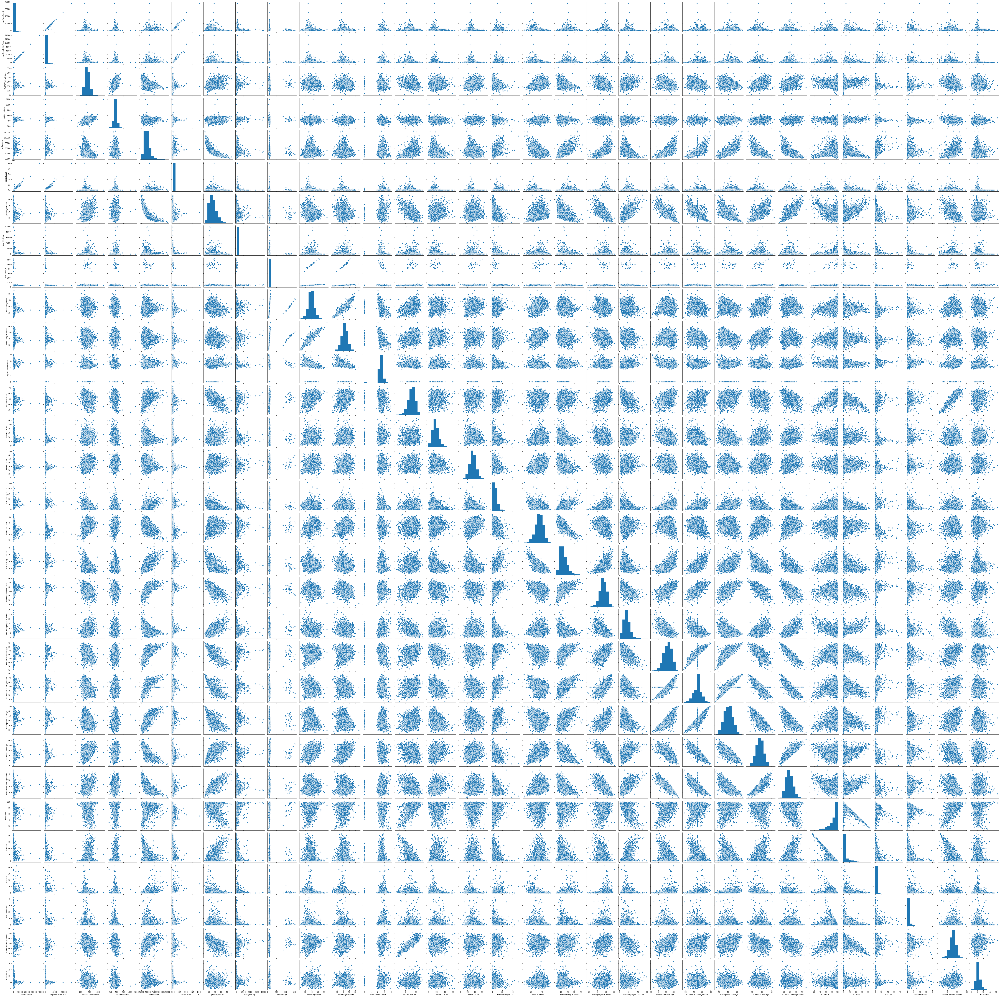

In [20]:
sns.pairplot(cancer1)
plt.show()

#### Building correlation matrix using corr() function

In [20]:
corrmatrix=cancer1.corr()
print(corrmatrix)

                         avgAnnCount  avgDeathsPerYear  TARGET_deathRate  \
avgAnnCount                 1.000000          0.939408         -0.143532   
avgDeathsPerYear            0.939408          1.000000         -0.090715   
TARGET_deathRate           -0.143532         -0.090715          1.000000   
incidenceRate               0.073553          0.062690          0.449432   
medIncome                   0.269145          0.223207         -0.428615   
popEst2015                  0.926894          0.977634         -0.120073   
povertyPercent             -0.135694         -0.066918          0.429389   
studyPerCap                 0.082071          0.063488         -0.022285   
MedianAge                  -0.024098         -0.024599          0.004375   
MedianAgeMale              -0.124969         -0.148487         -0.021929   
MedianAgeFemale            -0.122844         -0.144069          0.012048   
AvgHouseholdSize            0.064788          0.086161         -0.036905   
PercentMarri

In [15]:
cancer1.drop(['MedianAge','BirthRate','PctBlack','AvgHouseholdSize','PctPrivateCoverage','PctHS18_24'], axis = 1, inplace = True)
cancer1.head()

,avgAnnCount,avgDeathsPerYear,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAgeMale,MedianAgeFemale,...,PctUnemployed16_Over,PctPrivateCoverageAlone,PctEmpPrivCoverage,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctAsian,PctOtherRace,PctMarriedHouseholds,binnedinc1
0,1397.0,469,164.9,489.8,61898,260131,11.2,499.748204,36.9,41.7,...,8.0,48.453774,41.6,32.9,14.0,81.780529,4.821857,1.843479,52.856076,61494.5
1,173.0,70,161.3,411.6,48127,43269,18.6,23.111234,32.2,33.7,...,7.8,53.800000,43.6,31.1,15.3,89.228509,2.246233,3.741352,45.372500,48021.6
2,102.0,50,174.7,349.7,49348,21026,14.6,47.560164,44.0,45.8,...,7.0,43.500000,34.9,42.1,21.1,90.922190,0.465898,2.747358,54.444868,48021.6
3,427.0,202,194.8,430.4,44243,75882,17.1,342.637253,42.2,43.4,...,12.1,40.300000,35.0,45.3,25.0,91.744686,1.161359,1.362643,51.021514,42724.4
4,57.0,26,144.4,350.1,49955,10321,12.5,0.000000,47.8,48.9,...,4.8,43.900000,35.1,44.0,22.7,94.104024,0.665830,0.492135,54.027460,48021.6


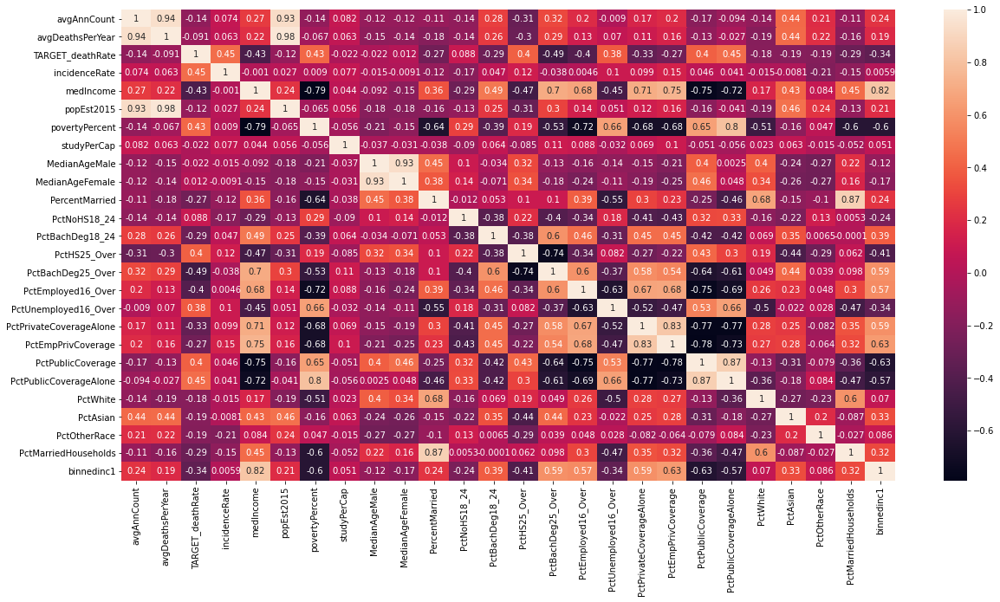

In [16]:
import seaborn as sns
plt.figure(figsize = (20,10)) # Size of the figure
sns.heatmap(cancer1.corr(),annot = True)
plt.show()

In [17]:
cancer1.drop(['PctEmpPrivCoverage','MedianAgeFemale','avgDeathsPerYear'], axis = 1, inplace = True)
cancer1.head()

,avgAnnCount,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAgeMale,Geography,PercentMarried,...,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverageAlone,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctAsian,PctOtherRace,PctMarriedHouseholds,binnedinc1
0,1397.0,164.9,489.8,61898,260131,11.2,499.748204,36.9,"Kitsap County, Washington",52.5,...,51.9,8.0,48.453774,32.9,14.0,81.780529,4.821857,1.843479,52.856076,61494.5
1,173.0,161.3,411.6,48127,43269,18.6,23.111234,32.2,"Kittitas County, Washington",44.5,...,55.9,7.8,53.800000,31.1,15.3,89.228509,2.246233,3.741352,45.372500,48021.6
2,102.0,174.7,349.7,49348,21026,14.6,47.560164,44.0,"Klickitat County, Washington",54.2,...,45.9,7.0,43.500000,42.1,21.1,90.922190,0.465898,2.747358,54.444868,48021.6
3,427.0,194.8,430.4,44243,75882,17.1,342.637253,42.2,"Lewis County, Washington",52.7,...,48.3,12.1,40.300000,45.3,25.0,91.744686,1.161359,1.362643,51.021514,42724.4
4,57.0,144.4,350.1,49955,10321,12.5,0.000000,47.8,"Lincoln County, Washington",57.8,...,48.2,4.8,43.900000,44.0,22.7,94.104024,0.665830,0.492135,54.027460,48021.6


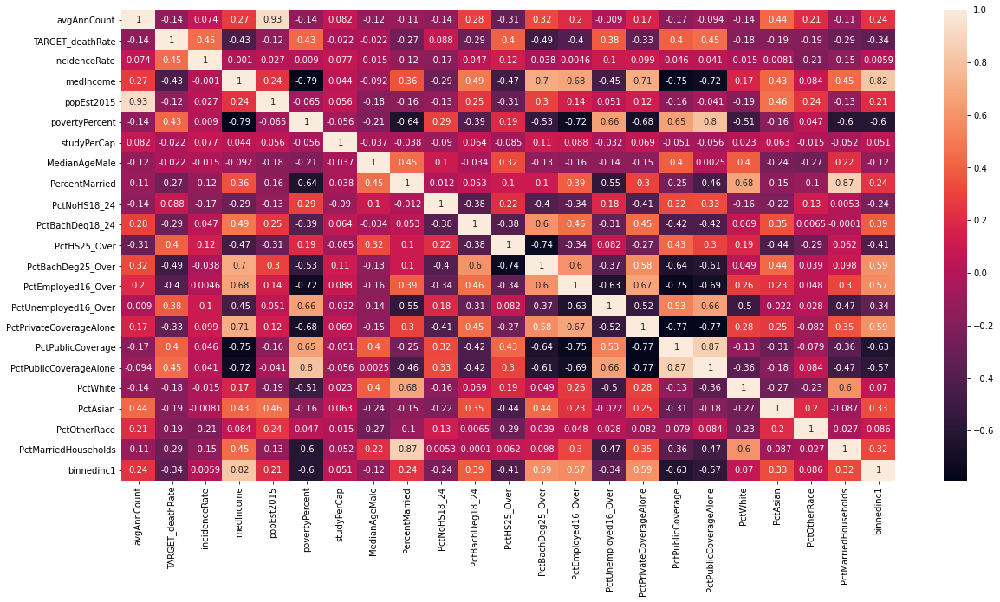

In [18]:
import seaborn as sns
plt.figure(figsize = (20,10)) # Size of the figure
sns.heatmap(cancer1.corr(),annot = True)
plt.show()

In [19]:
cancer1.describe()

,avgAnnCount,TARGET_deathRate,incidenceRate,medIncome,popEst2015,povertyPercent,studyPerCap,MedianAgeMale,PercentMarried,PctNoHS18_24,...,PctEmployed16_Over,PctUnemployed16_Over,PctPrivateCoverageAlone,PctPublicCoverage,PctPublicCoverageAlone,PctWhite,PctAsian,PctOtherRace,PctMarriedHouseholds,binnedinc1
count,3047.000000,3047.000000,3047.000000,3047.000000,3.047000e+03,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,...,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000,3047.000000
mean,606.338544,178.664063,448.268586,47063.281917,1.026374e+05,16.878175,155.399415,39.570725,51.773679,18.224450,...,54.152642,7.852412,48.453774,36.252642,19.240072,83.645286,1.253965,1.983523,51.243872,46109.755199
std,1416.356223,27.751511,54.560733,12040.090836,3.290592e+05,6.409087,529.628366,5.226017,6.896928,8.093064,...,8.104942,3.452371,9.018885,7.841741,6.113041,16.380025,2.610276,3.517710,6.572814,7720.722098
min,6.000000,59.700000,201.300000,22640.000000,8.270000e+02,3.200000,0.000000,22.400000,23.100000,0.000000,...,17.600000,0.400000,15.700000,11.200000,2.600000,10.199155,0.000000,0.000000,22.992490,34218.100000
25%,76.000000,161.200000,420.300000,38882.500000,1.168400e+04,12.150000,0.000000,36.350000,47.750000,12.800000,...,48.900000,5.500000,43.100000,30.900000,14.850000,77.296180,0.254199,0.295172,47.763063,40362.700000
50%,171.000000,178.100000,453.549422,45207.000000,2.664300e+04,15.900000,0.000000,39.600000,52.400000,17.100000,...,54.152642,7.600000,48.453774,36.300000,18.800000,90.059774,0.549812,0.826185,51.669941,46109.755199
75%,518.000000,195.200000,480.850000,52492.000000,6.867100e+04,20.400000,83.650776,42.500000,56.400000,22.700000,...,60.000000,9.700000,53.800000,41.550000,23.100000,95.451693,1.221037,2.177960,55.395132,51046.400000
max,38150.000000,362.800000,1206.900000,125635.000000,1.017029e+07,47.400000,9762.308998,64.700000,72.500000,64.100000,...,80.100000,29.400000,78.900000,65.100000,46.600000,100.000000,42.619425,41.930251,78.075397,61494.500000


#### Selecting featutres with more correlaton with TARGET_deathRate and scalilng them to bring them to a particular scale

In [20]:
import statsmodels.api as sm
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()

# List of variables to selected
df=cancer1[['incidenceRate','medIncome','povertyPercent','PctPublicCoverage','PctPublicCoverageAlone','PctHS25_Over','PctUnemployed16_Over','TARGET_deathRate']]
x=df[['incidenceRate','medIncome','povertyPercent','PctPublicCoverage','PctPublicCoverageAlone','PctHS25_Over','PctUnemployed16_Over']]
df_data=scaler.fit_transform(x);
df_data=pd.DataFrame(df_data,columns=['incidenceRate','medIncome','povertyPercent','PctPublicCoverage','PctPublicCoverageAlone','PctHS25_Over','PctUnemployed16_Over'])
y=df['TARGET_deathRate']
df_data.head()

,incidenceRate,medIncome,povertyPercent,PctPublicCoverage,PctPublicCoverageAlone,PctHS25_Over,PctUnemployed16_Over
0,0.286893,0.381164,0.180995,0.402597,0.259091,0.331924,0.262069
1,0.209129,0.247459,0.348416,0.369202,0.288636,0.391121,0.255172
2,0.147574,0.259314,0.257919,0.573284,0.420455,0.454545,0.227586
3,0.227824,0.209748,0.314480,0.632653,0.509091,0.509514,0.403448
4,0.147971,0.265207,0.210407,0.608534,0.456818,0.547569,0.151724


#### Plotting box plot to identify outliers

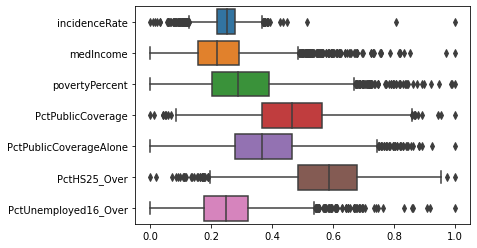

In [21]:
import seaborn as sns

sns.boxplot(data=df_data,orient='h')

#### Treatment of outliers using IQR method

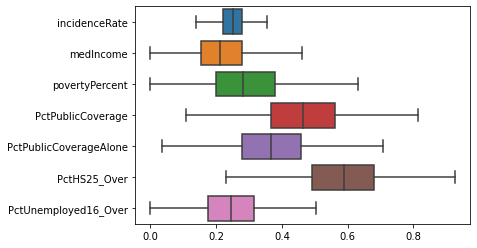

In [22]:
Q1=df_data.quantile(0.25)
Q3=df_data.quantile(0.75)
IQR=Q3-Q1
Lower_Whisker =Q1
Lower_Whisker-= 1.3*IQR
Upper_Whisker = 1.3*IQR
Upper_Whisker =Q3+Upper_Whisker 
df_data = df_data[df_data< Upper_Whisker]
df_data = df_data[df_data> Lower_Whisker]
sns.boxplot(data=df_data,orient='h')

In [23]:
df_data.isnull().sum()

incidenceRate             144
medIncome                 149
povertyPercent             95
PctPublicCoverage          41
PctPublicCoverageAlone     57
PctHS25_Over               57
PctUnemployed16_Over       90
dtype: int64

#### Treating null values identified after treatement of outliers

In [24]:
mean2 = df_data.mean()
df_data.fillna(mean2,inplace=True)

In [25]:
df_data.isnull().sum()

incidenceRate             0
medIncome                 0
povertyPercent            0
PctPublicCoverage         0
PctPublicCoverageAlone    0
PctHS25_Over              0
PctUnemployed16_Over      0
dtype: int64

##### Plotting scatter plot to visualise data

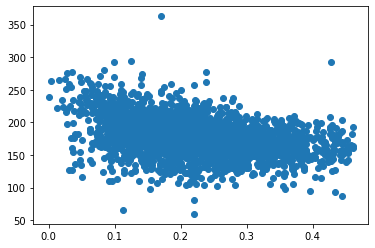

In [26]:
plt.scatter(df_data.medIncome,y)
plt.show()

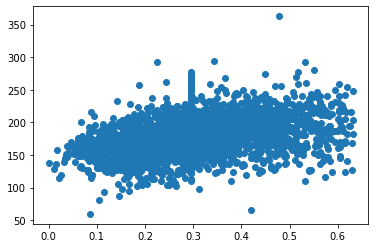

In [27]:
plt.scatter(df_data.povertyPercent,y)
plt.show()

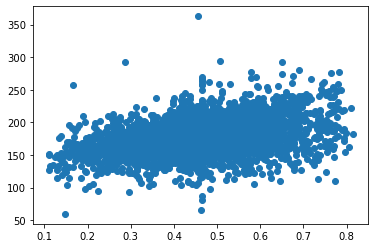

In [28]:
plt.scatter(df_data.PctPublicCoverage ,y)
plt.show()

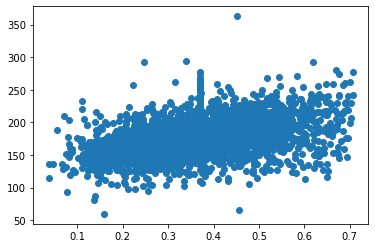

In [29]:
plt.scatter(df_data.PctPublicCoverageAlone ,y)
plt.show()

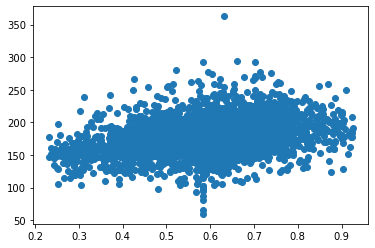

In [30]:
plt.scatter(df_data.PctHS25_Over ,y)
plt.show()

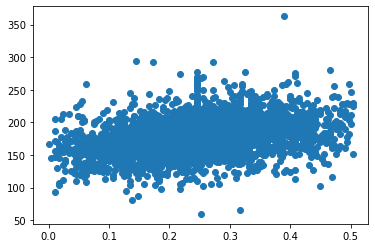

In [31]:
plt.scatter(df_data.PctUnemployed16_Over ,y)
plt.show()

##### we can observe that all the features follow almost a linear relationship with target death rate

### Now comes splitting the data into training and testing data
30% test

70% train

In [32]:
from sklearn.model_selection import train_test_split

# We specify this so that the train and test data set always have the same rows, respectively
x_train,x_test,y_train,y_test=train_test_split(df_data,y,test_size=0.30,random_state=1500)

### Building the model

#### Using sklearn library to build the linear regression model

In [33]:
from sklearn.linear_model import LinearRegression
reg=LinearRegression()
reg.fit(x_train,y_train)


LinearRegression()

#### Predicting y values by the model built by us

In [34]:
y_pred=reg.predict(x_test)

#### Checking for r^2 value

In [35]:
from sklearn.metrics import r2_score
score=r2_score(y_test,y_pred)
score

0.4084273229604226

#### Now checking other parameters like VIF

In [36]:
import statsmodels.api as sm
x_train_lm = sm.add_constant(x_train)

lr_2 = sm.OLS(y_train, x_train_lm).fit()

# Print a summary of the linear regression model obtained


print(lr_2.summary())

                            OLS Regression Results                            
Dep. Variable:       TARGET_deathRate   R-squared:                       0.380
Model:                            OLS   Adj. R-squared:                  0.378
Method:                 Least Squares   F-statistic:                     185.7
Date:                Tue, 18 Aug 2020   Prob (F-statistic):          5.81e-215
Time:                        15:30:02   Log-Likelihood:                -9602.3
No. Observations:                2132   AIC:                         1.922e+04
Df Residuals:                    2124   BIC:                         1.927e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
const                     87

In [37]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [38]:
vif = pd.DataFrame()
vif['Features'] = x_train_lm.columns
vif['VIF'] = [variance_inflation_factor(x_train_lm.values, i) for i in range(x_train_lm.shape[1])]
vif['VIF'] = round(vif['VIF'], 2)
vif = vif.sort_values(by = "VIF", ascending = False)
vif

,Features,VIF
0,const,122.24
5,PctPublicCoverageAlone,4.45
4,PctPublicCoverage,3.57
3,povertyPercent,3.07
2,medIncome,2.61
7,PctUnemployed16_Over,1.70
6,PctHS25_Over,1.21
1,incidenceRate,1.03


#### Seeing the other parameters like Adj. R-squared , R-squared , AIC, BIC etc 

### Residual Analysis of the train data

In [39]:
y_train_price = lr_2.predict(x_train_lm)

Text(0.5, 0, 'Errors')

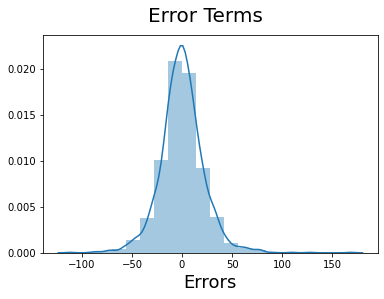

In [40]:
# Plot the histogram of the error terms

fig = plt.figure()
sns.distplot((y_train - y_train_price), bins = 20)
fig.suptitle('Error Terms', fontsize = 20)                  # Plot heading 
plt.xlabel('Errors', fontsize = 18) 

##### Clearly the error terms follow normal distribution . 

### Making Predictions Using the Final Model

In [41]:
X_test_m4 = sm.add_constant(x_test)

In [42]:
y_pred_m4 = lr_2.predict(X_test_m4)

Text(0, 0.5, 'y_pred')

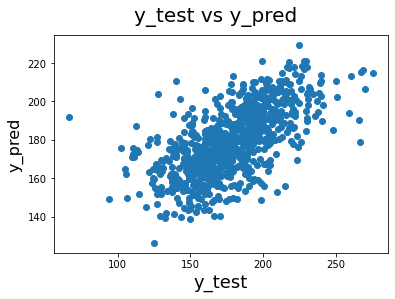

In [43]:
# Plotting y_test and y_pred to understand the spread

fig = plt.figure()
plt.scatter(y_test, y_pred_m4)
fig.suptitle('y_test vs y_pred', fontsize = 20)              # Plot heading 
plt.xlabel('y_test', fontsize = 18)                          # X-label
plt.ylabel('y_pred', fontsize = 16)  

### Our best fit line is:
216.13 x incidenceRate - 49.71 x medIncome + 21.26 x povertyPercent - 9.96 x PctPublicCoverage + 30.53 x PctPublicCoverageAlone + 48.31 x PctHS25_Over  + 30.81 x PctUnemployed16_Over

Overall we have a decent model, but we also acknowledge that we could do better.

We have a couple of options:

1. Add new features ( PctEmployed16_Over, etc.)
2. Build a non-linear model